# (Dataset Exploration Title)
## by (your name here)

## Preliminary Wrangling

> Briefly introduce your dataset here.

In [171]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline


> Load in your dataset and describe its properties through the questions below.
Try and motivate your exploration goals through this section.

In [3]:
df = pd.read_csv('pisa2012.csv', encoding='latin-1')
df.head()

c:\users\bassel\appdata\local\programs\python\python38\lib\site-packages\IPython\core\interactiveshell.py:3145: DtypeWarning: Columns (15,16,17,21,22,23,24,25,26,30,31,36,37,45,65,123,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,475) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,Unnamed: 0,CNT,SUBNATIO,STRATUM,OECD,NC,SCHOOLID,STIDSTD,ST01Q01,ST02Q01,...,W_FSTR75,W_FSTR76,W_FSTR77,W_FSTR78,W_FSTR79,W_FSTR80,WVARSTRR,VAR_UNIT,SENWGT_STU,VER_STU
0,1,Albania,80000,ALB0006,Non-OECD,Albania,1,1,10,1.0,...,13.7954,13.9235,13.1249,13.1249,4.3389,13.0829,19,1,0.2098,22NOV13
1,2,Albania,80000,ALB0006,Non-OECD,Albania,1,2,10,1.0,...,13.7954,13.9235,13.1249,13.1249,4.3389,13.0829,19,1,0.2098,22NOV13
2,3,Albania,80000,ALB0006,Non-OECD,Albania,1,3,9,1.0,...,12.7307,12.7307,12.7307,12.7307,4.2436,12.7307,19,1,0.1999,22NOV13
3,4,Albania,80000,ALB0006,Non-OECD,Albania,1,4,9,1.0,...,12.7307,12.7307,12.7307,12.7307,4.2436,12.7307,19,1,0.1999,22NOV13
4,5,Albania,80000,ALB0006,Non-OECD,Albania,1,5,9,1.0,...,12.7307,12.7307,12.7307,12.7307,4.2436,12.7307,19,1,0.1999,22NOV13


# What is the structure of the data?

In [4]:
df.shape

(485490, 636)

Due to having such large amount of features, I wish to limit the number of features.


For my analysis, I wanted to focus on how gender plays a role in not only students' mathematics scores but also students' attitude towards mathematics. I also wanted to take a look at if the parents attitude towards children's mathematics differ among the gender. For these reasons, I have decided to focus on the following features:

**Student Information**
+ CNT: Country
+ ST04Q01: Gender


**Student Mathematics Scores**
+ PV1MATH:	Overall Mathematics Score


**Student's Attitude Towards Mathematics**
+ **Instrumental Motivation**
    + ST29Q02:	Worthwhile for Work
    + ST29Q05:	Worthwhile for Career Chances
    + ST29Q07:	Important for Future Study
    + ST29Q08:	Helps to Get a Job


+ **Math Anxiety**
    + ST42Q01:	Worry That It Will Be Difficult
    + ST42Q03:	Get Very Tense
    + ST42Q05:	Get Very Nervous
    + ST42Q08:	Feel Helpless
    + ST42Q10:	Worry About Getting Poor <Grades>
	
+ **Math Self-Concept**
    + ST42Q02:	Not Good at Maths
    + ST42Q04:	Get Good (Grades)
    + ST42Q06:	Learn Quickly
    + ST42Q07:	One of Best Subjects
    + ST42Q09:	Understand Difficult Work

+ **Math Interest**
    + ST29Q01:	Enjoy Reading
    + ST29Q03:	Look Forward to Lessons
    + ST29Q04:	Enjoy Maths
    + ST29Q06:	Interested
    
+ **Math Work Ethic**	
    + ST46Q01:	Homework Completed in Time
    + ST46Q02:	Work Hard on Homework
    + ST46Q03:	Prepared for Exams
    + ST46Q04:	Study Hard for Quizzes
    + ST46Q05:	Study Until I Understand Everything
    + ST46Q06:	Pay Attention in Classes
    + ST46Q07:	Listen in Classes
    + ST46Q08:	Avoid Distractions When Studying
    + ST46Q09:	Keep Work Organized
    
+ **Math Behaviour**	
    + ST49Q01:	Talk about Maths with Friends
    + ST49Q02:	Help Friends with Maths
    + ST49Q03:	(Extracurricular) Activity
    + ST49Q04:	Participate in Competitions
    + ST49Q05:	Study More Than 2 Extra Hours a Day
    + ST49Q06:	Play Chess
    + ST49Q07:	Computer programming
    + ST49Q09:	Participate in Math Club


**Subjective Norms**
   + ST35Q04:	Parents Believe Studying Mathematics Is Important
   + ST35Q05:	Parents Believe Mathematics Is Important for Career
   + ST35Q06:	Parents Like Mathematics


## Organized Selected Features

In [6]:
#organize features by category list

#CNT: country, ST04Q01: gender
student_info=['CNT','ST04Q01']

#PV1MATH: Overall Math Score
scores=['PV1MATH']

#ST29Q02: Worthwhile for Work, ST29Q05: Worthwhile for Career Chances, ST29Q07: Important for Future Study
#ST29Q08: Helps to Get a Job
motivation=['ST29Q02','ST29Q05','ST29Q07','ST29Q08']

#ST42Q01: Worry That It Will Be Difficult, ST42Q03: Get Very Tense, ST42Q05: Get Very Nervous
#ST42Q08: Feel Helpless, ST42Q10: Worry About Getting Poor <Grades>
anxiety=['ST42Q01','ST42Q03','ST42Q05','ST42Q08','ST42Q10']

#ST42Q02: Not Good at Maths, ST42Q04: Get Good (Grades), ST42Q06: Learn Quickly
#ST42Q07: One of Best Subjects, ST42Q09: Understand Difficult Work
self=['ST42Q02','ST42Q04','ST42Q06','ST42Q07','ST42Q09']

#ST29Q01: Enjoy Reading, ST29Q03: Look Forward to Lessons, ST29Q04: Enjoy Maths, ST29Q06: Interested
interest=['ST29Q01','ST29Q03','ST29Q04','ST29Q06']

#ST46Q01: Homework Completed in Time, ST46Q02: Work Hard on Homework, ST46Q03: Prepared for Exams
#ST46Q04: Study Hard for Quizzes, ST46Q05: Study Until I Understand Everything, ST46Q06: Pay Attention in Classes
#ST46Q07: Listen in Classes, ST46Q08: Avoid Distractions When Studying, ST46Q09: Keep Work Organized
work_ethic= ['ST46Q01','ST46Q02','ST46Q03','ST46Q04','ST46Q05','ST46Q06','ST46Q07','ST46Q08','ST46Q09']

#ST49Q01: Talk about Maths with Friends,ST49Q02: Help Friends with Maths, ST49Q03: (Extracurricular) Activity
#ST49Q04: Participate in Competitions, ST49Q05: Study More Than 2 Extra Hours a Day, ST49Q06: Play Chess
#ST49Q07: Computer programming, ST49Q09: Participate in Math Club
behavior=['ST49Q01','ST49Q02','ST49Q03','ST49Q04','ST49Q05','ST49Q06','ST49Q07','ST49Q09']

#ST35Q04: Parents Believe Studying Mathematics Is Important
#ST35Q05: Parents Believe Mathematics Is Important for Career
#ST35Q06:Parents Like Mathematics
parents=['ST35Q04','ST35Q05','ST35Q06']

In [7]:
features = [student_info, scores, motivation, anxiety, self, interest, work_ethic, behavior, parents]
str_features = ['student_info', 'scores', 'motivation', 'anxiety', 'self',' interest', 'work_ethic', 'behavior', 'parents']
print(str_features)

['student_info', 'scores', 'motivation', 'anxiety', 'self', ' interest', 'work_ethic', 'behavior', 'parents']


In [8]:
for i,_ in enumerate(features):
    print(str_features[i])
    for feature in _:
        print(df[feature].value_counts(), '\n')

student_info
Mexico                      33806
Italy                       31073
Spain                       25313
Canada                      21544
Brazil                      19204
                            ...  
Florida (USA)                1896
Perm(Russian Federation)     1761
Massachusetts (USA)          1723
Connecticut (USA)            1697
Liechtenstein                 293
Name: CNT, Length: 68, dtype: int64 

Female    245064
Male      240426
Name: ST04Q01, dtype: int64 

scores
444.1580    359
439.4843    354
452.7263    349
455.8420    346
458.1788    343
           ... 
206.5041      1
196.0664      1
157.2753      1
124.0146      1
897.7333      1
Name: PV1MATH, Length: 7063, dtype: int64 

motivation
Agree                150479
Strongly agree        97133
Disagree              49792
Strongly disagree     18069
Name: ST29Q02, dtype: int64 

Agree                153313
Strongly agree        99425
Disagree              44218
Strongly disagree     18275
Name: ST29Q05, dtyp

In [9]:
for i,_ in enumerate(features):
    print(str_features[i], '\n')
    print(df[_].isnull().any(axis=1).sum())
    print(df[_].isnull().any(axis=1).mean(), '\n')
            

student_info 

0
0.0 

scores 

0
0.0 

motivation 

172796
0.3559208222620445 

anxiety 

178065
0.3667737749490206 

self 

178559
0.36779130363138274 

 interest 

173879
0.35815155821953076 

work_ethic 

178759
0.36820325856351316 

behavior 

178378
0.36741848441780467 

parents 

173808
0.35800531421862447 



#### The percent of missing values in each feature is almost the same 35%

In [12]:
df['CNT'].value_counts()

Mexico                      33806
Italy                       31073
Spain                       25313
Canada                      21544
Brazil                      19204
                            ...  
Florida (USA)                1896
Perm(Russian Federation)     1761
Massachusetts (USA)          1723
Connecticut (USA)            1697
Liechtenstein                 293
Name: CNT, Length: 68, dtype: int64

#### Note the USA three states which is not accurate for being among countries' column, so we have to deal with them.

In [22]:
attitudes=[motivation,anxiety,self,interest,work_ethic,behavior]
attitudes_str = ['motivation','anxiety','self','interest','work_ethic','behavior']


In [25]:
for i,_ in enumerate(features):
    print(str_features[i])
    print(df[_].head(), '\n')

student_info
       CNT ST04Q01
0  Albania  Female
1  Albania  Female
2  Albania  Female
3  Albania  Female
4  Albania  Female 

scores
    PV1MATH
0  406.8469
1  486.1427
2  533.2684
3  412.2215
4  381.9209 

motivation
          ST29Q02         ST29Q05         ST29Q07         ST29Q08
0  Strongly agree           Agree           Agree  Strongly agree
1  Strongly agree           Agree        Disagree        Disagree
2  Strongly agree  Strongly agree  Strongly agree  Strongly agree
3             NaN             NaN             NaN             NaN
4  Strongly agree  Strongly agree  Strongly agree  Strongly agree 

anxiety
          ST42Q01   ST42Q03         ST42Q05   ST42Q08   ST42Q10
0           Agree     Agree           Agree  Disagree  Disagree
1             NaN       NaN             NaN       NaN       NaN
2             NaN       NaN             NaN       NaN       NaN
3             NaN  Disagree           Agree  Disagree     Agree
4  Strongly agree     Agree  Strongly agree  Disagree

In [18]:
for i,_ in enumerate(attitudes):
    print(attitudes_str[i])
    for feature in _:
        print(df[feature].value_counts(), '\n')

motivation
Agree                150479
Strongly agree        97133
Disagree              49792
Strongly disagree     18069
Name: ST29Q02, dtype: int64 

Agree                153313
Strongly agree        99425
Disagree              44218
Strongly disagree     18275
Name: ST29Q05, dtype: int64 

Agree                132131
Strongly agree        90470
Disagree              65853
Strongly disagree     26612
Name: ST29Q07, dtype: int64 

Agree                150347
Strongly agree        85236
Disagree              57949
Strongly disagree     21700
Name: ST29Q08, dtype: int64 

anxiety
Agree                134489
Disagree              83359
Strongly agree        68696
Strongly disagree     27311
Name: ST42Q01, dtype: int64 

Disagree             135714
Agree                 80655
Strongly disagree     60345
Strongly agree        35462
Name: ST42Q03, dtype: int64 

Disagree             140694
Agree                 84811
Strongly disagree     54941
Strongly agree        32178
Name: ST42Q05, dt

## Motivation, Anxiety, Self, Interest, and Work Ethics have:

>Agree 
>
>Strongly agree
>
>Disagree
>
>Strongly disagree

## Behavior has:
>Sometimes
>
>Never or Rarely
>
>Often
>
>Always or Almost always
## Math Self-Concept
> Not good at math is considered Negative (We will consider while transforming it)

## Check for duplicates

In [26]:
df.duplicated().sum()

0

### Here is the summary for the cleaning process
<ol>
    <li>Reduce the features from 636 to 41 features and combine them to get 8 features</li>
<li>Remove missing data which are considered 35 % of the data</li>
<li>Deal with the anomalous {Not good at math}</li>
<li>Rename these features for easier analysis</li>
<li>Save the data after cleaning</li>
</ol>

### 1- Choose features to keep

In [75]:
keep=['CNT', 'ST04Q01', 'PV1MATH','ST29Q02', 'ST29Q05', 'ST29Q07', 'ST29Q08', 'ST42Q01',
      'ST42Q03', 'ST42Q05', 'ST42Q08','ST42Q10', 'ST42Q02', 'ST42Q04', 'ST42Q06',
      'ST42Q07', 'ST42Q09', 'ST29Q01', 'ST29Q03', 'ST29Q04', 'ST29Q06','ST46Q01',
      'ST46Q02', 'ST46Q03', 'ST46Q04', 'ST46Q05', 'ST46Q06', 'ST46Q07', 'ST46Q08',
      'ST46Q09','ST49Q01', 'ST49Q02', 'ST49Q03', 'ST49Q04', 'ST49Q05', 'ST49Q06',
      'ST49Q07', 'ST49Q09','ST35Q04', 'ST35Q05', 'ST35Q06']

### 2- Copy the data and drop nan

In [76]:
df_new = df.copy()
df_new = df_new[keep]
df_new.dropna(inplace = True)

In [77]:
df_new.shape

(139736, 41)

### 3- Setup value points for features

In [79]:
#Setting value points for the features
points_1={'Strongly agree':4,'Agree': 3,'Disagree': 2, 'Strongly disagree':1}
points_2={'Always or almost always': 4, 'Often':3, 'Sometimes':2, 'Never or rarely':1}
points_3 = {'Strongly agree':1, 'Agree': 2, 'Disagree': 3, 'Strongly disagree':4}

### 4- Data Preprocessing

In [80]:
#Create a function to scale the features and get new col for each collection of features
def com_features(features, comb_value, value_point):
    
    for feature in features:
        df_new.loc[:,feature] = df_new.loc[:,feature].map(value_point)
    
    df_new[comb_value] = df_new.loc[:,features].sum(axis = 1, skipna = False)/len(features)

In [83]:
#Motivation
com_features(motivation, 'motivation', points_1)

#Anxiaty
com_features(anxiety, 'anxiety', points_1)

#Math Interest
com_features(interest, 'interest', points_1)
com_features(parents, 'parents', points_1)

#Math Work Ethics
com_features(work_ethic, 'work_ethic', points_1)

#Behavior
com_features(behavior, 'behavior', points_2)

#Self_Concept
com_features(self, 'self_concept', points_3)

In [95]:
df_new.rename(columns = {'CNT': 'country', 'ST04Q01': 'gender', 'PV1MATH':'math_score'}, inplace = True)

In [97]:
full_features = ['country', 'gender', 'math_score', 'motivation', 'anxiety', 'interest', 'parents', 'work_ethic', 'behavior', 'self_concept']
df_full = df_new[full_features]

In [104]:
states=['Florida (USA)','Massachusetts (USA)','Connecticut (USA)']
df_full['country'].replace(states, 'United States of America', inplace=True)

c:\users\bassel\appdata\local\programs\python\python38\lib\site-packages\pandas\core\series.py:4563: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().replace(


### 5- Save the data to psia2012_cleaned for future use in exploration

In [105]:
df_full.to_csv('psia2012_cleaned.csv', index_label= False)

### The data is now cleaned and we can start explore with visualizations

## Univariate Exploration

> In this section, investigate distributions of individual variables. If
you see unusual points or outliers, take a deeper look to clean things up
and prepare yourself to look at relationships between variables.

In [4]:
df_ = pd.read_csv('psia2012_cleaned.csv')
df_.head()

,country,gender,math_score,motivation,anxiety,interest,parents,work_ethic,behavior,self_concept
0,Albania,Female,406.8469,3.5,2.6,3.0,3.000000,3.000000,1.750,2.4
8,Albania,Female,434.1097,3.0,2.4,3.0,3.333333,3.000000,1.625,2.0
15,Albania,Male,381.2977,4.0,3.8,4.0,3.333333,3.000000,2.875,1.6
16,Albania,Female,246.3078,4.0,2.8,4.0,4.000000,3.000000,2.500,2.0
31,Albania,Male,236.8827,4.0,2.2,3.0,2.666667,2.777778,2.000,2.2


> Make sure that, after every plot or related series of plots, that you
include a Markdown cell with comments about what you observed, and what
you plan on investigating next.

### 1) Who is the biggest males or females?

In [5]:
df_['gender'].value_counts()

Female    71917
Male      67819
Name: gender, dtype: int64

Text(0.5, 1.0, 'Students By Gender')

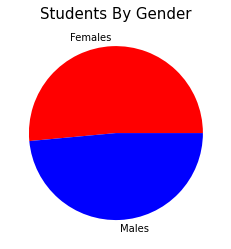

In [14]:
plt.pie(df_['gender'].value_counts(), colors = ['r', 'b'], labels = ['Females', 'Males']);
plt.title('Students By Gender', size=15)

#### From the plot they're almost the same

### 2)The countries Distribution 

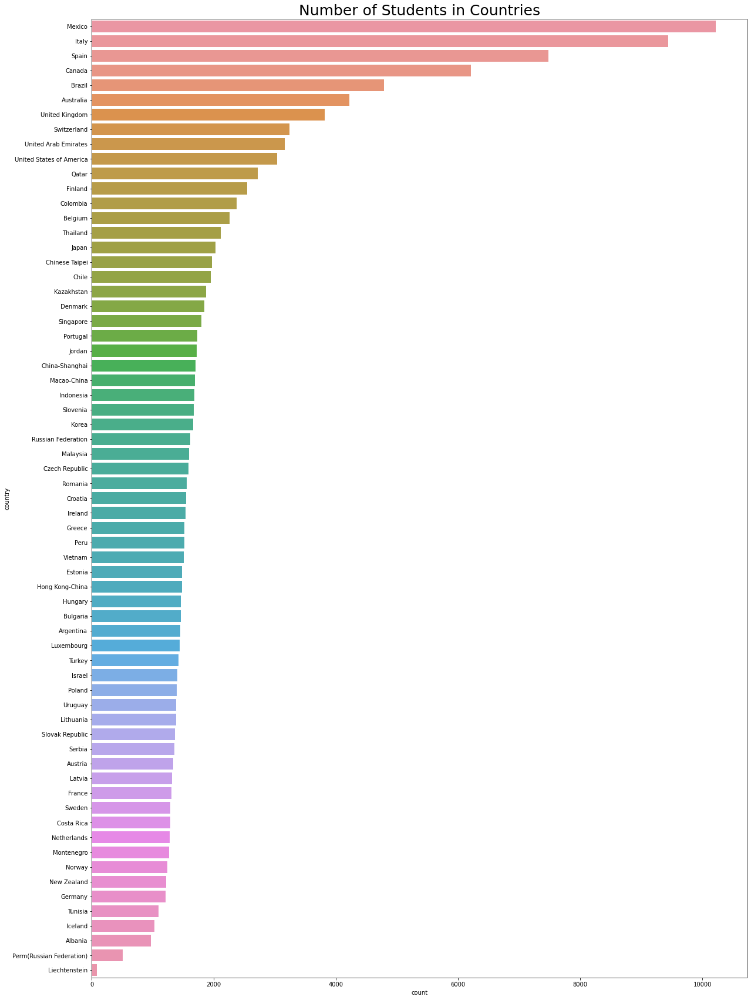

In [7]:
order = df_['country'].value_counts().index
plt.figure(figsize = [20,30])
sns.countplot(data = df_, y = 'country', order = order)
plt.title('Number of Students in Countries', size=25)
plt.show()

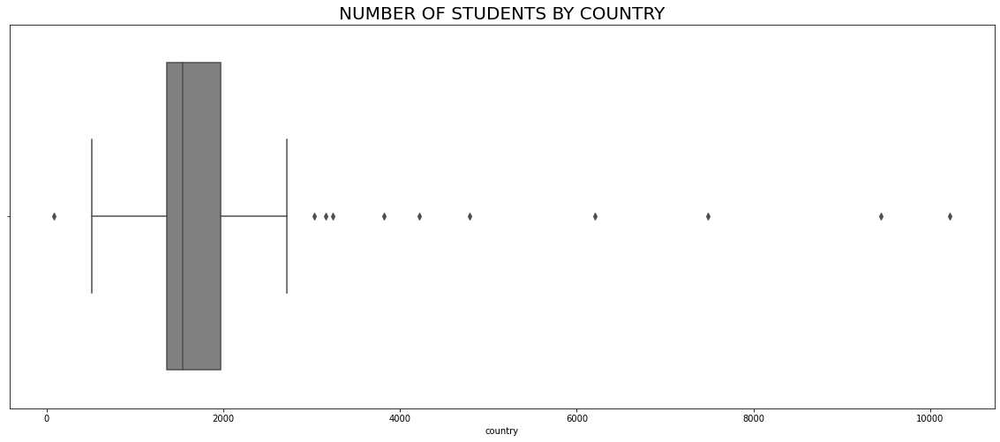

In [8]:
plt.figure(figsize=(20,8))
sns.boxplot(df_['country'].value_counts(), color='gray')
plt.title('NUMBER OF STUDENTS BY COUNTRY', size=20);

<ol>
<li>From the countplot: -  Mexico, Italy, and Spain the highest number of students</li>
<li>Boxplot shows they are outliers</li>
</ol>

In [19]:
df_['math_score'].describe()

count    139736.000000
mean        478.714273
std          99.903298
min          41.914600
25%         406.223700
50%         474.536500
75%         547.445100
max         924.840300
Name: math_score, dtype: float64

Text(0.5, 1.0, 'Overall Math Score')

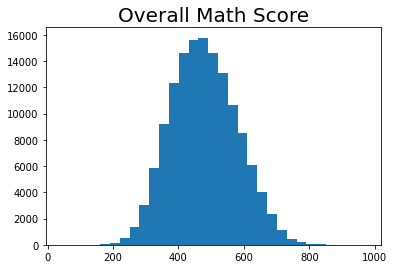

In [21]:
#Overall Math Score
plt.hist(df_['math_score'], bins = np.arange(41,924+50,30))
plt.title("Overall Math Score", size = 20)

## 3) Attitude towards math

In [9]:
attitudes = ['motivation', 'anxiety','interest', 'work_ethic', 'behavior', 'self_concept']

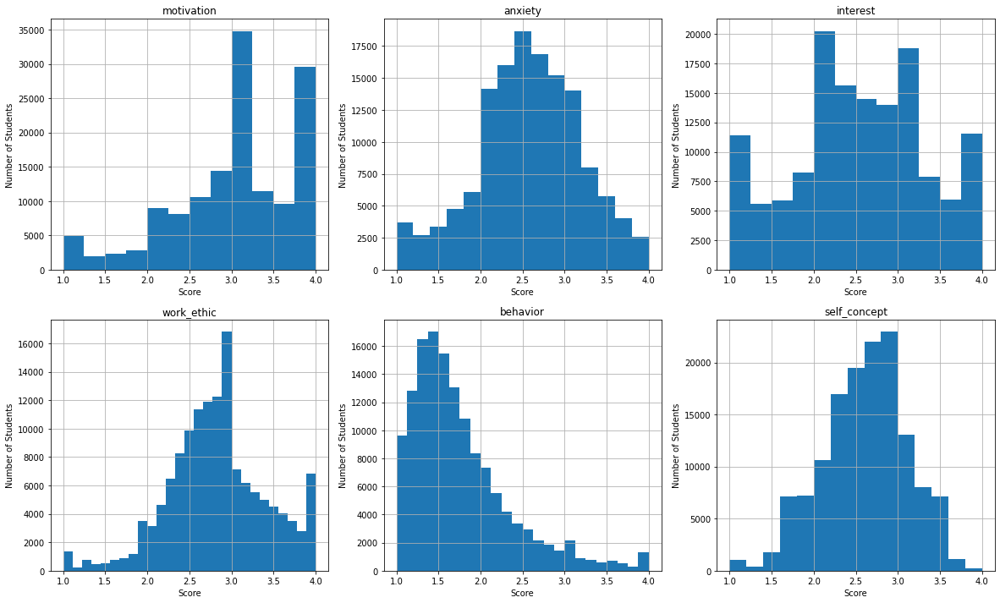

In [10]:
fig, ax = plt.subplots(nrows = 2, ncols=3, figsize = (20,12))

ax = ax.flatten()

#binsize = 1/number of questions per section
binsizes=[1/4,1/5,1/4,1/9,1/8,1/5]


for i,feature in enumerate(attitudes):
    bins=np.arange(min(df_[feature]), max(df_[feature]) +binsizes[i], binsizes[i])
    ax[i].hist(data=df_, x=feature, bins=bins)
    ax[i].set_xlabel('Score')
    ax[i].set_ylabel('Number of Students')
    ax[i].set_title(feature)
    ax[i].grid()


<ol>
    <li>Motivation shows left skewed</li>
    <li>Anxiety is normally distributed</li>
    <li>Work ethics is skewed to the left</li>
    <li>Behavior is right skewed which means most student don't do extra activities towards math</li>
</ol>

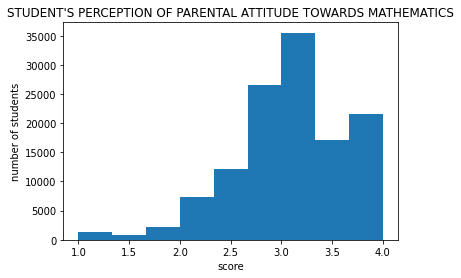

In [11]:
binsize=1/3
bins=np.arange(df_['parents'].min(),df_['parents'].max() +binsize, binsize)

plt.hist(data=df_, x='parents', bins=bins)
plt.xlabel('score')
plt.ylabel('number of students')
plt.title('STUDENT\'S PERCEPTION OF PARENTAL ATTITUDE TOWARDS MATHEMATICS');

#### It seems that student are highly affected by their parents views

## Bivariate Exploration

> In this section, investigate relationships between pairs of variables in your
data. Make sure the variables that you cover here have been introduced in some
fashion in the previous section (univariate exploration).

### 1) Country with Gender

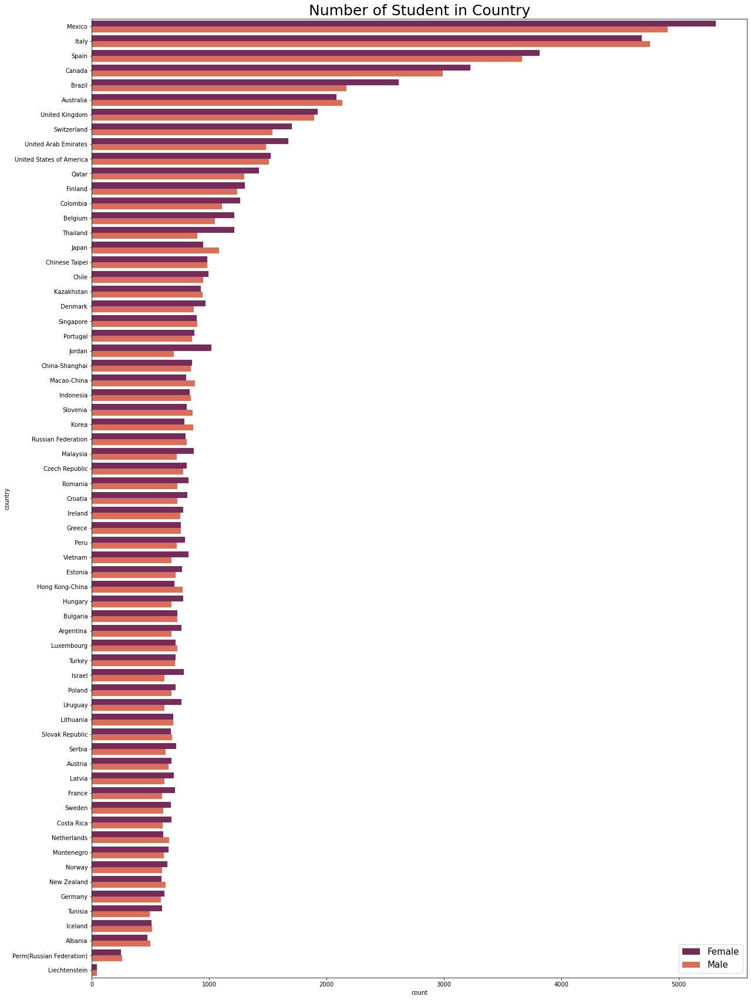

In [45]:
plt.figure(figsize = (20,30))
sns.countplot(data = df_, y = 'country', hue = 'gender', palette = 'rocket', order=order)
plt.legend(prop={'size': 15})
plt.title('Number of Student in Country', size = 25)
plt.show()

#### The gender of each country is almost split equally, except some countries need to be checked

In [72]:
df_gender = pd.DataFrame(df_.groupby(['country', 'gender']).size()).reset_index().pivot(index = 'country', columns = 'gender', values = 0).reset_index()

In [94]:
df_gender['total'] = df_gender['Female']+df_gender['Male']
df_gender['mpercent'] = 100*df_gender['Male']/(df_gender['total'])
df_gender['fpercent'] = 100*df_gender['Female']/(df_gender['total'])
df_gender['difference'] = np.absolute(df_gender['fpercent'] - df_gender['mpercent'])

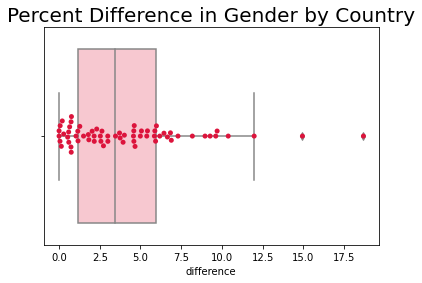

In [98]:
sns.boxplot(data = df_gender, x = 'difference', color='pink')
sns.swarmplot(data = df_gender, x = 'difference', color='crimson')
plt.title('Percent Difference in Gender by Country', size=20);

In [96]:
df_gender.query("difference > 12.3")

gender,country,Female,Male,mpercent,fpercent,difference,total
29,Jordan,1019,698,40.652301,59.347699,18.695399,1717
57,Thailand,1215,899,42.526017,57.473983,14.947966,2114


In [97]:
df_gender.sort_values(by = 'total', ascending =  False).head(10)

gender,country,Female,Male,mpercent,fpercent,difference,total
38,Mexico,5316,4906,47.994522,52.005478,4.010957,10222
27,Italy,4685,4754,50.365505,49.634495,0.731010,9439
54,Spain,3817,3665,48.984229,51.015771,2.031542,7482
7,Canada,3222,2989,48.124296,51.875704,3.751409,6211
5,Brazil,2615,2171,45.361471,54.638529,9.277058,4786
2,Australia,2084,2133,50.580982,49.419018,1.161963,4217
61,United Kingdom,1924,1895,49.620319,50.379681,0.759361,3819
56,Switzerland,1703,1539,47.470697,52.529303,5.058606,3242
60,United Arab Emirates,1675,1486,47.010440,52.989560,5.979121,3161
62,United States of America,1525,1509,49.736322,50.263678,0.527357,3034



<ol>
    <li>There is an  outlier (Jordan, Thailand)</li>
    <li>Checking the top ten countries: females are always the majority for 8 out of 10 countries</li>
</ol>

### 2) Score with Gender

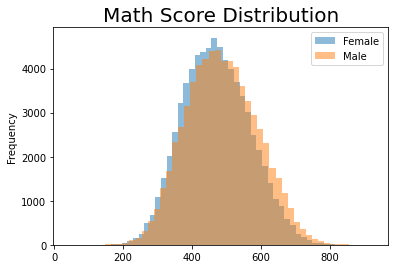

In [106]:
df_.groupby('gender')['math_score'].plot(kind = 'hist', alpha=0.5, bins=50)
plt.legend()
plt.title('Math Score Distribution', size = 20);

#### Males are doing much better than females

### 3) Attitude towards Math with Gender

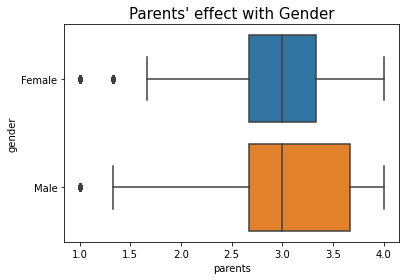

In [116]:
sns.boxplot(data = df_, y = 'gender', x = 'parents', orient="h")
plt.title('Parents\' effect with Gender', size = 15);

Both are greatly affected by their parents, but males seem to be less more. (shown in the third quartile)

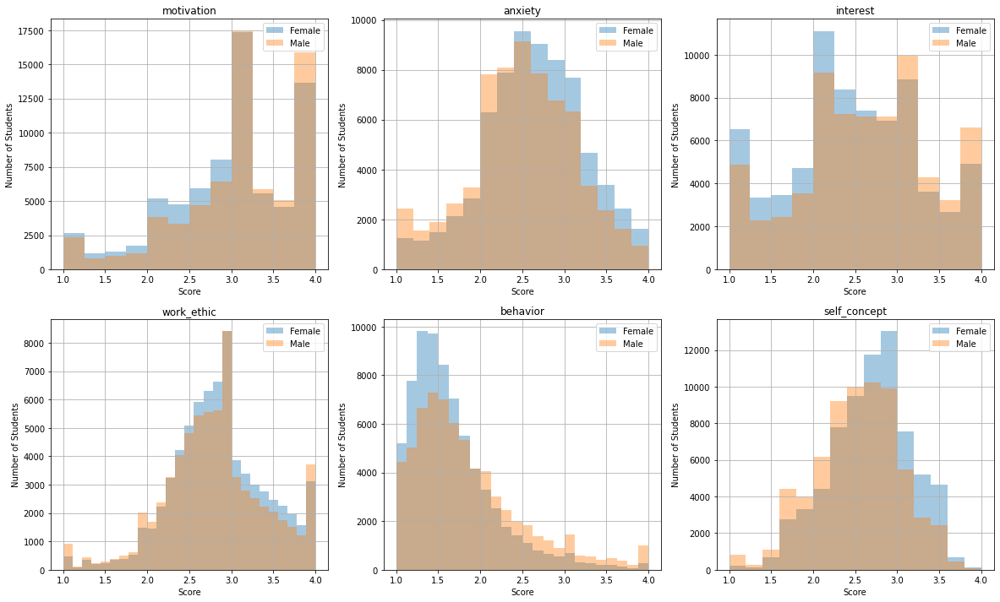

In [121]:
#Attitudes
attitude=['motivation', 'anxiety','interest', 'work_ethic', 'behavior', 'self_concept']

fig, ax= plt.subplots(nrows=2,ncols=3,figsize=[20,12])

#binsizes = 1/(number of questions per section)
binsizes=[1/4,1/5,1/4,1/9,1/8,1/5]

ax=ax.flatten()


for i,feature in enumerate(attitude):
    bins=np.arange(min(df_[feature]), max(df_[feature]) +binsizes[i], binsizes[i])
    ax[i].hist(data=df_.query('gender=="Female"'), x=feature, bins=bins,label='Female', alpha=.4)
    ax[i].hist(data=df_.query('gender=="Male"'),x=feature, bins=bins,label='Male', alpha=.4)
    
    ax[i].set_xlabel('Score')
    ax[i].set_ylabel('Number of Students')
    ax[i].set_title(feature)
    ax[i].legend()
    ax[i].grid()
  

<li>Male Students tend to be affected more than females in motivation, and interest </li>
<li>Females tend to have high scores in anxiety, and self_concept</li>

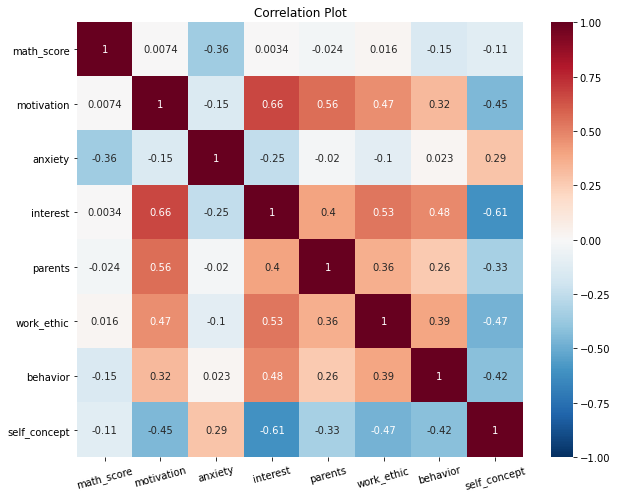

In [134]:
#Check if there is any correlations between the features
plt.figure(figsize=(10,8))
sns.heatmap(df_.corr(), cmap="RdBu_r", annot=True, vmin=-1, vmax=1)
plt.xticks(rotation = 15)
plt.title("Correlation Plot", size=12)
plt.show()

**We can see that there is a moderate positive correlation between motivation and (interest-parents-work_ethic,behavior) and a negative moderate correlation between self_concept and(interest, work_ethics, behavior).**

## Multivariate Exploration

> Create plots of three or more variables to investigate your data even
further. Make sure that your investigations are justified, and follow from
your work in the previous sections.

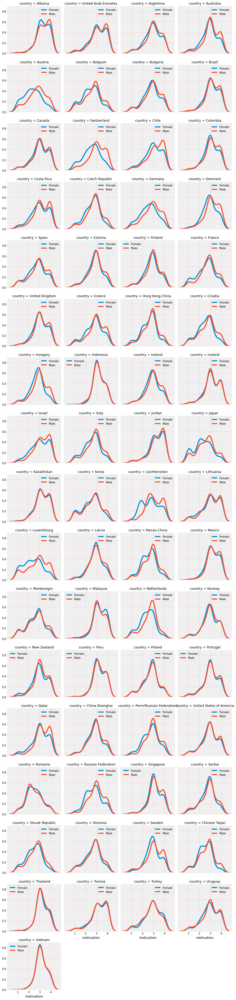

In [197]:
a = sns.FacetGrid(data = df_, col = 'country', col_wrap = 4,  hue='gender')
a.map(sns.kdeplot, 'motivation', bw = 1/4)

for ax, c in zip(a.axes.flat, df_.country):
    ax.legend()
    ax.grid(color = 'pink', linestyle = '--')


**Due to the fact that most countries do not have an even 50/50 split among gender, I wanted to depict the motivation scores by density.**

**Almost all countries show the male students outweighing female students in motivation scores.**

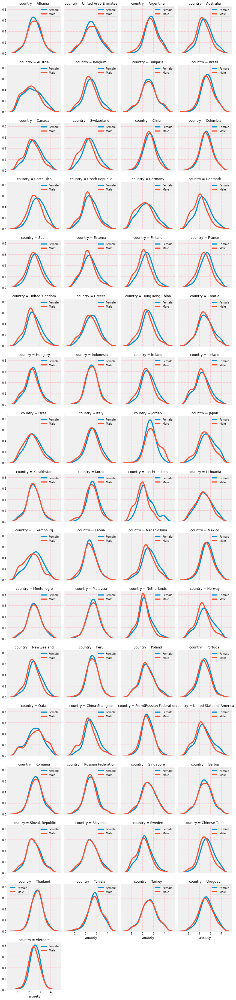

In [201]:
a = sns.FacetGrid(data = df_, col = 'country', col_wrap = 4,  hue='gender')
a.map(sns.kdeplot, 'anxiety', bw = 1/4)

for ax, c in zip(a.axes.flat, df_.country):
    ax.legend()
    ax.grid(color = 'pink', linestyle = '--')

**Almost all countries show the female students outweighing male students in anxiety scores.**

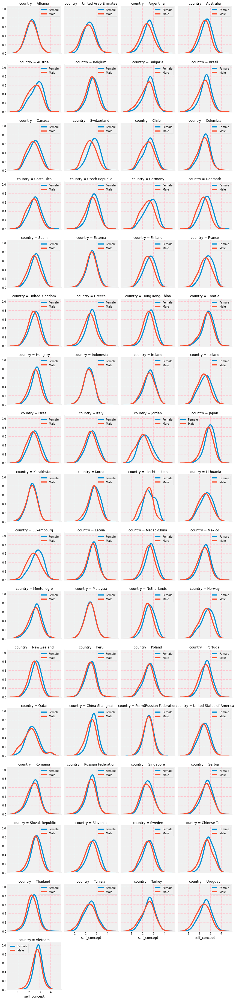

In [202]:
a = sns.FacetGrid(data = df_, col = 'country', col_wrap = 4,  hue='gender')
a.map(sns.kdeplot, 'self_concept', bw = 1/4)

for ax, c in zip(a.axes.flat, df_.country):
    ax.legend()
    ax.grid(color = 'pink', linestyle = '--')

**Almost all countries show the female students outweighing male students in self_concept scores.**

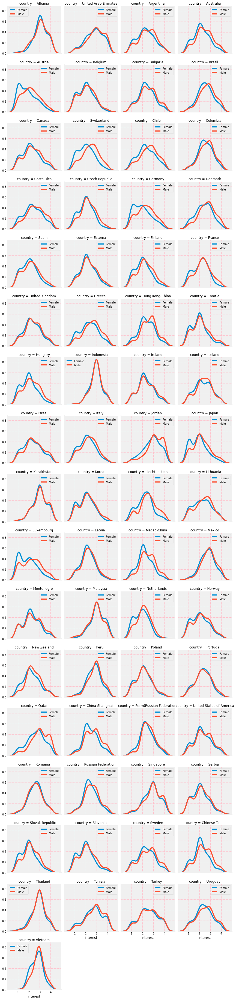

In [203]:
a = sns.FacetGrid(data = df_, col = 'country', col_wrap = 4,  hue='gender')
a.map(sns.kdeplot, 'interest', bw = 1/4)

for ax, c in zip(a.axes.flat, df_.country):
    ax.legend()
    ax.grid(color = 'pink', linestyle = '--')


**Almost all countries show the male students outweighing female students in interest scores.**

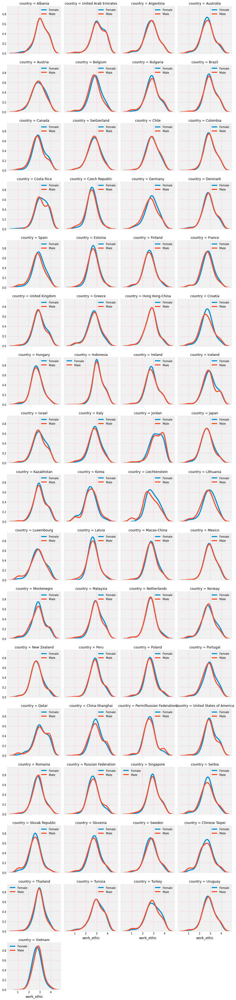

In [199]:
a = sns.FacetGrid(data = df_, col = 'country', col_wrap = 4,  hue='gender')
a.map(sns.kdeplot, 'work_ethic', bw = 1/4)

for ax, c in zip(a.axes.flat, df_.country):
    ax.legend()
    ax.grid(color = 'pink', linestyle = '--')


**Almost all countries show the male students are the same as female students in wrok_ethic scores.**

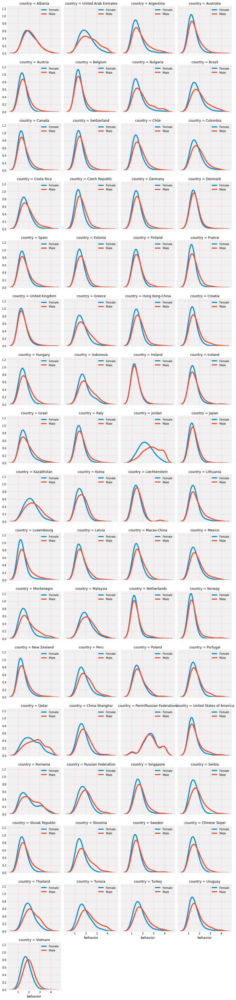

In [200]:
a = sns.FacetGrid(data = df_, col = 'country', col_wrap = 4,  hue='gender')
a.map(sns.kdeplot, 'behavior', bw = 1/4)

for ax, c in zip(a.axes.flat, df_.country):
    ax.legend()
    ax.grid(color = 'pink', linestyle = '--')


**Almost all countries show the male students outweighing female students in motivation scores.**

> At the end of your report, make sure that you export the notebook as an
html file from the `File > Download as... > HTML` menu. Make sure you keep
track of where the exported file goes, so you can put it in the same folder
as this notebook for project submission. Also, make sure you remove all of
the quote-formatted guide notes like this one before you finish your report!

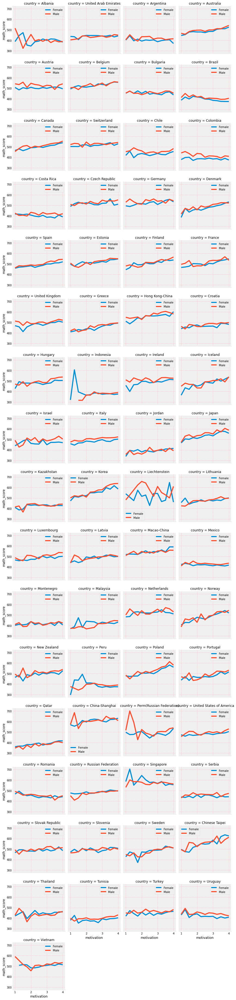

In [209]:
a = sns.FacetGrid(data = df_, col = 'country', col_wrap = 4,  hue='gender')
a.map(sns.lineplot, 'motivation', 'math_score', ci = False)

for ax, c in zip(a.axes.flat, df_.country):
    ax.legend()
    ax.grid(color = 'pink', linestyle = '--')


<li>Motivation has a bigger effect on getting high scores in males than females</li>
<li>There is an anomalous with Indonesia, Singapora, and Russia</li>

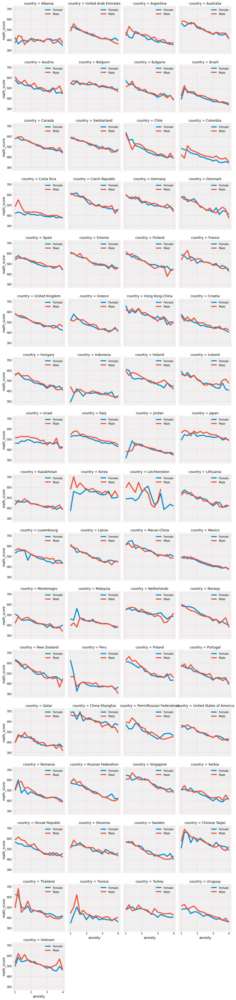

In [210]:
a = sns.FacetGrid(data = df_, col = 'country', col_wrap = 4,  hue='gender')
a.map(sns.lineplot, 'anxiety', 'math_score', ci = False)

for ax, c in zip(a.axes.flat, df_.country):
    ax.legend()
    ax.grid(color = 'pink', linestyle = '--')


<li>High scores with anxiety causes low math score</li>
<li>But males are still getting high scores in most countries</li>

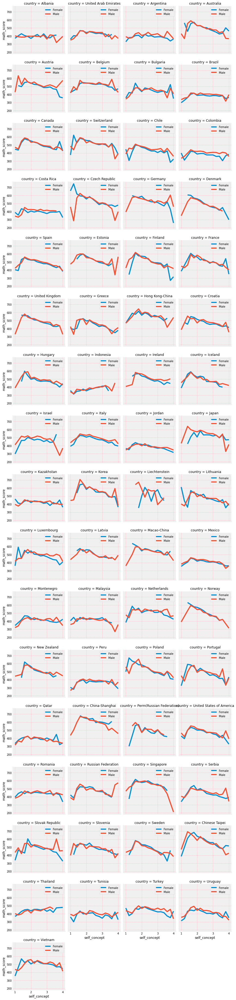

In [211]:
a = sns.FacetGrid(data = df_, col = 'country', col_wrap = 4,  hue='gender')
a.map(sns.lineplot, 'self_concept', 'math_score', ci = False)

for ax, c in zip(a.axes.flat, df_.country):
    ax.legend()
    ax.grid(color = 'pink', linestyle = '--')


<li>Self_concept has almost the effect on scores for both males and females</li>


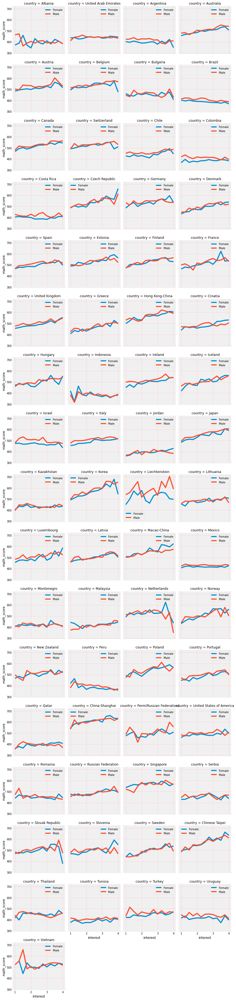

In [212]:
a = sns.FacetGrid(data = df_, col = 'country', col_wrap = 4,  hue='gender')
a.map(sns.lineplot, 'interest', 'math_score', ci = False)

for ax, c in zip(a.axes.flat, df_.country):
    ax.legend()
    ax.grid(color = 'pink', linestyle = '--')


<li>There is an increase in scores according to interest</li>
<li>Most Countries have males doing better scores than females</li>

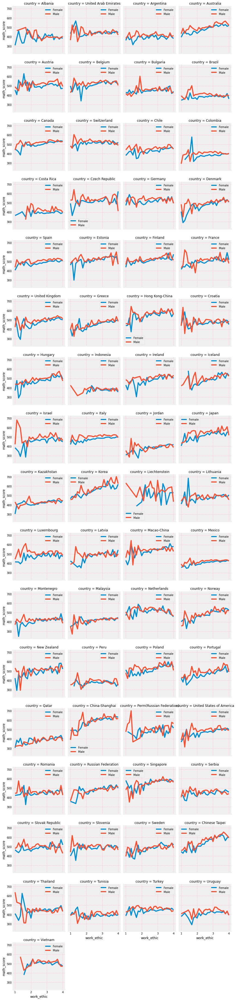

In [213]:
a = sns.FacetGrid(data = df_, col = 'country', col_wrap = 4,  hue='gender')
a.map(sns.lineplot, 'work_ethic', 'math_score', ci = False)

for ax, c in zip(a.axes.flat, df_.country):
    ax.legend()
    ax.grid(color = 'pink', linestyle = '--')


<li>Work_Ethic is the same for both males and females on getting their math scores</li>

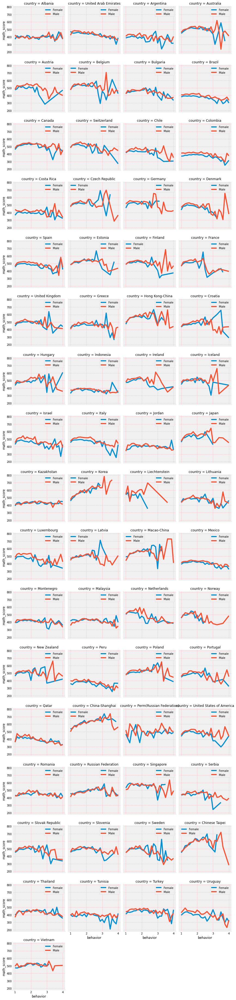

In [208]:
a = sns.FacetGrid(data = df_, col = 'country', col_wrap = 4,  hue='gender')
a.map(sns.lineplot, 'behavior', 'math_score', ci = False)

for ax, c in zip(a.axes.flat, df_.country):
    ax.legend()
    ax.grid(color = 'pink', linestyle = '--')


Both genders are doing bad in scores for high score of behavior

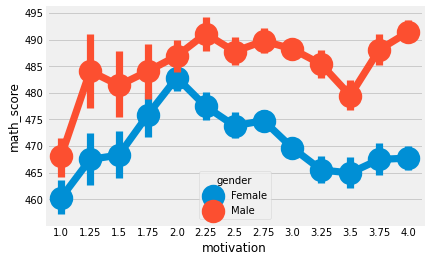

In [219]:
sns.pointplot(data = df_, x = 'motivation', y = 'math_score', hue = 'gender')
plt.show()

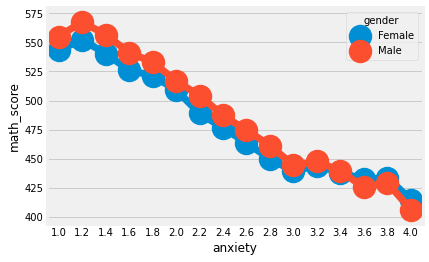

In [220]:
sns.pointplot(data = df_, x = 'anxiety', y = 'math_score', hue = 'gender')
plt.show()

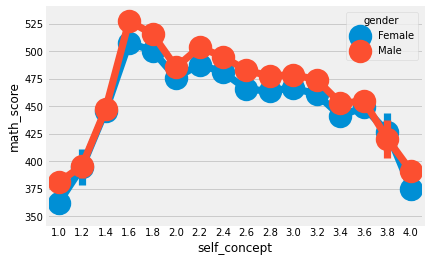

In [221]:
sns.pointplot(data = df_, x = 'self_concept', y = 'math_score', hue = 'gender')
plt.show()

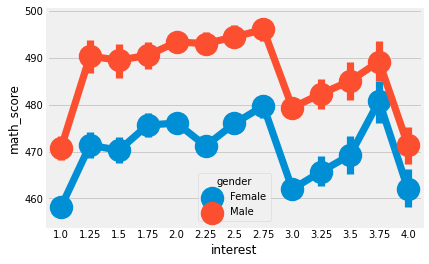

In [222]:
sns.pointplot(data = df_, x = 'interest', y = 'math_score', hue = 'gender')
plt.show()

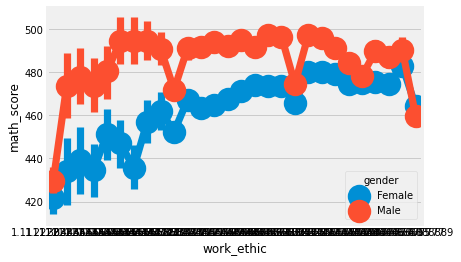

In [223]:
sns.pointplot(data = df_, x = 'work_ethic', y = 'math_score', hue = 'gender')
plt.show()

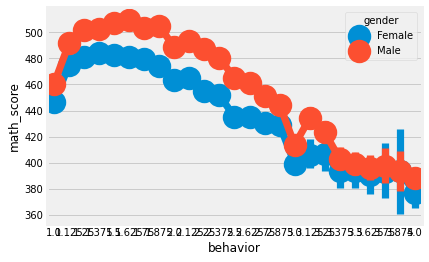

In [224]:
sns.pointplot(data = df_, x = 'behavior', y = 'math_score', hue = 'gender')
plt.show()